# Vector data

Authors: David Shean & Scott Henderson

SnowEx Hackweek July 13, 2021

```{admonition} Learning Objectives
*A 30 minute guide to vector data for SnowEX Hackweek*
- find, visualize, interpret vector data formats
- use Python raster libraries [geopandas](https://geopandas.readthedocs.io/en/stable/)
```

## GeoPandas

pandas is great, but what if we want to do some geospatial operations - like reproject our vector data or compute the intersection between Point and Polygon features?

Enter Geopandas - all the great things about pandas, plus geo! (http://geopandas.org/).

>"GeoPandas is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and descartes and matplotlib for plotting."

>"GeoPandas enables you to easily do operations in python that would otherwise require a spatial database such as PostGIS."

Under the hood, GeoPandas is `pandas` plus some other core geospatial packages:
* `shapely` for geometry operations (https://shapely.readthedocs.io/en/stable/manual.html)
* `fiona` for reading/writing GIS file formats (https://fiona.readthedocs.io/en/latest/manual.html)
* `pyproj` for projections and coordinate system transformations (http://pyproj4.github.io/pyproj/stable/)

Under those hoods are lower-level geospatial libraries (GEOS, GDAL/OGR, PROJ4) that provide a foundation for most GIS software (open-source and commercial).  I encourage you to explore these - I guarantee you will learn something valuable.

* `GEOS` https://trac.osgeo.org/geos/
* `GDAL/OGR` https://gdal.org/
* `PROJ` https://proj.org/

For now, let's explore some basic geopandas functionality.

In [1]:
import geopandas as gpd
import hvplot.pandas
import holoviews as hv

### GeoDataFrame vs. GeoSeries
* https://geopandas.org/data_structures.html
* Indexing and selection - `iloc`, `loc`
* Pandas `squeeze`: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.squeeze.html

In [2]:
gpd.GeoDataFrame?

Init signature: gpd.GeoDataFrame(*args, geometry=None, crs=None, **kwargs)
Docstring:     
A GeoDataFrame object is a pandas.DataFrame that has a column
with geometry. In addition to the standard DataFrame constructor arguments,
GeoDataFrame also accepts the following keyword arguments:

Parameters
----------
crs : value (optional)
    Coordinate Reference System of the geometry objects. Can be anything accepted by
    :meth:`pyproj.CRS.from_user_input() <pyproj.crs.CRS.from_user_input>`,
    such as an authority string (eg "EPSG:4326") or a WKT string.
geometry : str or array (optional)
    If str, column to use as geometry. If array, will be set as 'geometry'
    column on GeoDataFrame.

Examples
--------
Constructing GeoDataFrame from a dictionary.

>>> from shapely.geometry import Point
>>> d = {'col1': ['name1', 'name2'], 'geometry': [Point(1, 2), Point(2, 1)]}
>>> gdf = geopandas.GeoDataFrame(d, crs="EPSG:4326")
>>> gdf
    col1                 geometry
0  name1  POINT (1.00000 2

## Let's use some Polygons for US States

Hmmm, let's see.  Two choices:
1. We could go to ESRI or the U.S. Census website, identify and download a shapefile, unzip 4+ files, copy/paste the appropriate \*.shp filename into the notebook.  Wait, how can I download on a remote server?  OK, maybe run something like `wget http://...`, unzip, provide absolute path  
*- OR -*
2. Give geopandas a url string that points to a GeoJSON file somewhere on the web, and read dynamically

Yeah, let's go with #2

Let's use the US States 5M GeoJSON here: http://eric.clst.org/tech/usgeojson/

* JSON (JavaScript Object Notation) is a structured text-based data format. A Jupyter notebook is a json text file. 
* GeoJSON extends this format to include geospatial information. It's pretty great. If you are unfamiliar, take a moment to read about GeoJSON: https://en.wikipedia.org/wiki/GeoJSON

Take a look at the 5M file contents in your browser or download and open with a text editor.  Note organization structure.  How does this compare to, say, a Python dictionary object? 

This is a GeoJSON file!

Read the file using GeoPandas by passing the url to `gpd.read_file()`.

In [3]:
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

In [4]:
states_gdf.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US01,01,Alabama,,50645.326,"MULTIPOLYGON (((-88.12466 30.28364, -88.08681 ..."
1,0400000US02,02,Alaska,,570640.950,"MULTIPOLYGON (((-166.10574 53.98861, -166.0752..."
2,0400000US04,04,Arizona,,113594.084,"POLYGON ((-112.53859 37.00067, -112.53454 37.0..."
3,0400000US05,05,Arkansas,,52035.477,"POLYGON ((-94.04296 33.01922, -94.04304 33.079..."
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-122.42144 37.86997, -122.4213..."


<AxesSubplot:>

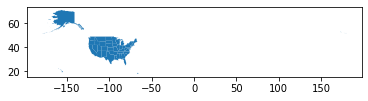

In [5]:
states_gdf.plot()

### Check the CRS
* Note that this was defined when we opened the file with GeoPandas - by default, a GeoJSON is assumed to use EPSG:4326 coordinate system for geodetic latitude and longitude

In [6]:
states_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
states_gdf.hvplot()

:Polygons   [x,y]

In [8]:
states_gdf.hvplot(geo=True)

:Polygons   [Longitude,Latitude]

## Reprojection and Coordinate Systems

All of the above examples used standard geodetic lat/lon coordinate system (EPSG:4326).  This is fine for global analyses and basic visualization.  But remember that the width of a degree of longitude varies with latitude (~111 km near equator, ~0 m near pole), so our plots have scaling and aspect ratio issues.

We need to choose a map projection that is appropriate for our data. This decision is important for visualization, but is also critical for precise quantitative analysis. For example, if you want to compute area or volume change, you should use an equal-area projection. If you want to calculate distances between two points, you should use an equidistant projection.

https://www.axismaps.com/guide/general/map-projections/

Sadly, there is no "perfect" projection. You, as the mapmaker or data analyst, are responsible for choosing a projection with the right characteristics for your purposes. Let's explore a bit further, and we'll revisit some general guidelines later.

### Use GeoPandas to reproject your GeoDataFrame

* Use the very convenient `to_crs()` method to reproject: https://geopandas.org/projections.html
* Start by reprojecting the points to a Universal Transverse Mercator (UTM), Zone 11N (EPSG:32611)
* Store the output as a new GeoDataFrame
* Do a quick `head()` and note the new values in the `geometry` column

In [9]:
states_gdf_utm = states_gdf.to_crs('EPSG:26912')

In [10]:
states_gdf.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US01,01,Alabama,,50645.326,"MULTIPOLYGON (((-88.12466 30.28364, -88.08681 ..."
1,0400000US02,02,Alaska,,570640.950,"MULTIPOLYGON (((-166.10574 53.98861, -166.0752..."
2,0400000US04,04,Arizona,,113594.084,"POLYGON ((-112.53859 37.00067, -112.53454 37.0..."
3,0400000US05,05,Arkansas,,52035.477,"POLYGON ((-94.04296 33.01922, -94.04304 33.079..."
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-122.42144 37.86997, -122.4213..."


In [11]:
states_gdf_utm.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US01,01,Alabama,,50645.326,"MULTIPOLYGON (((2728573.862 3582373.583, 27329..."
1,0400000US02,02,Alaska,,570640.950,"MULTIPOLYGON (((-2860135.360 7480772.224, -286..."
2,0400000US04,04,Arizona,,113594.084,"POLYGON ((363098.765 4096053.495, 363458.991 4..."
3,0400000US05,05,Arkansas,,52035.477,"POLYGON ((2093046.203 3784200.544, 2091908.643..."
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-506166.725 4253415.876, -5061..."


In [12]:
print(states_gdf.crs)
print(states_gdf_utm.crs)

epsg:4326
EPSG:26912


In [13]:
states_gdf_utm.hvplot(aspect='equal') * hv.VLine(0).opts(color='k', line_width=0.5)

:Overlay
   .Polygons.I :Polygons   [x,y]
   .VLine.I    :VLine   [x,y]

In [14]:
states_gdf.to_crs('EPSG:26913').hvplot(aspect='equal') * hv.VLine(0).opts(color='k', line_width=0.5)

:Overlay
   .Polygons.I :Polygons   [x,y]
   .VLine.I    :VLine   [x,y]

## Summary

Excellent, but what did we just do?

Under the hood, GeoPandas used the `pyproj` library (a Python API for PROJ) to transform each point from one coordinate system to another coordinate system.  

I guarantee that you've all done this kind of thing before, you may just not remember it or recognize it in this context. See: https://en.wikipedia.org/wiki/List_of_common_coordinate_transformations

In 2D, transforming (x,y) coordinates between different projections (e.g., WGS84 vs. UTM) on the same reference ellipsoid is pretty straightforward.  Things start to get more complicated when you include different ellipsoid models, horizontal/vertical datums, etc.  Oh, also the Earth's surface is not static - plate tectonics make everything more complicated, as time becomes important, and transformations must include a "kinematic" component.  

Fortunately, the `PROJ` library (https://proj.org/about.html) has generalized much of the complicated math for geodetic coordinate transformations.  It's been under development since the 1980s, and our understanding of the Earth's shape and plate motions has changed dramatically in that time period.  So, still pretty complicated, and there are different levels of support/sophistication in the tools/libraries that use `PROJ`.

We aren't going to get into the details here, but feel free to take a look at the Transformations section here to get a sense of how this is actually accomplished: https://proj.org/operations/index.html

The UTM projection we used above is not the best choice for our data extent, which span several UTM zones:
https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system#/media/File:Utm-zones-USA.svg. 

We used Zone 12N, which means that our map will have limited distortion within that zone centered on -111°W.  But distortion will increase beyond the width of the -114° to -108°W zone definition.